![headers_fraud-prev](headers_fraud-prev.jpg)


# Credit Card Fraud

This dataset consists of credit card transactions in the western United States. It includes information about each transaction including customer details, the merchant and category of purchase, and whether or not the transaction was a fraud.

Note: You can access the data via the File menu or in the Context Panel at the top right of the screen next to Report, under Files. The data dictionary and filenames can be found at the bottom of this workbook.

[Source: Kaggle](https://www.kaggle.com/kartik2112/fraud-detection?select=fraudTrain.csv) The data was partially cleaned and adapted by DataCamp.

We've added some guiding questions for analyzing this exciting dataset! Feel free to make this workbook yours by adding and removing cells, or editing any of the existing cells.

## Explore this dataset

Here are some ideas to get your started with your analysis...
1. 🗺️ **Explore**: What types of purchases are most likely to be instances of fraud? Consider both product category and the amount of the transaction.
2. 📊 **Visualize**: Use a geospatial plot to visualize the fraud rates across different states.
3. 🔎 **Analyze**: Are older customers significantly more likely to be victims of credit card fraud?

### 🔍 **Scenario: Accurately Predict Instances of Credit Card Fraud**

This scenario helps you develop an end-to-end project for your portfolio.

**Background:** A new credit card company has just entered the market in the western United States. The company is promoting itself as one of the safest credit cards to use. They have hired you as their data scientist in charge of identifying instances of fraud. The executive who hired you has have provided you with data on credit card transactions, including whether or not each transaction was fraudulent.

**Objective:** The executive wants to know how accurately you can predict fraud using this data. She has stressed that the model should err on the side of caution: it is not a big problem to flag transactions as fraudulent when they aren't just to be safe. In your report, you will need to describe how well your model functions and how it adheres to these criteria.

You will need to prepare a report that is accessible to a broad audience. It will need to outline your motivation, analysis steps, findings, and conclusions.

## Data Dictionary

| transdatetrans_time | Transaction DateTime                        |
|---------------------|---------------------------------------------|
| merchant            | Merchant Name                               |
| category            | Category of Merchant                        |
| amt                 | Amount of Transaction                       |
| city                | City of Credit Card Holder                  |
| state               | State of Credit Card Holder                 |
| lat                 | Latitude Location of Purchase               |
| long                | Longitude Location of Purchase              |
| city_pop            | Credit Card Holder's City Population        |
| job                 | Job of Credit Card Holder                   |
| dob                 | Date of Birth of Credit Card Holder         |
| trans_num           | Transaction Number                          |
| merch_lat           | Latitude Location of Merchant               |
| merch_long          | Longitude Location of Merchant              |
| is_fraud            | Whether Transaction is Fraud (1) or Not (0) |

You can query the pre-loaded CSV file using SQL directly. Here’s a **sample query**, followed by some sample Python code and outputs:

In [1]:
SELECT * FROM 'credit_card_fraud.csv'
LIMIT 5

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:44+00:00,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21 00:00:00+00:00,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0
1,2019-01-01 00:00:51+00:00,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19 00:00:00+00:00,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0
2,2019-01-01 00:07:27+00:00,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21 00:00:00+00:00,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0
3,2019-01-01 00:09:03+00:00,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30 00:00:00+00:00,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,0
4,2019-01-01 00:21:32+00:00,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02 00:00:00+00:00,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,0


## Analysis start here!

In [2]:
import pandas as pd 
ccf = pd.read_csv('credit_card_fraud.csv')
ccf.head(100)

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:44,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0
1,2019-01-01 00:00:51,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0
2,2019-01-01 00:07:27,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0
3,2019-01-01 00:09:03,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,0
4,2019-01-01 00:21:32,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2019-01-01 06:20:49,Hudson-Ratke,grocery_pos,199.55,Littleton,CO,39.5994,-105.0044,320420,Water engineer,1975-07-31,a5c13edd756f36c026630d13672974bd,38.619691,-105.498059,0
96,2019-01-01 06:24:47,Harber Inc,gas_transport,94.48,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,c9235f76ecb45e67372d79ecac2ffb37,49.513555,-117.819653,0
97,2019-01-01 06:25:07,Berge LLC,gas_transport,79.39,Mesa,ID,44.6255,-116.4493,129,Cartographer,1965-12-15,606b05a976ee2bca7323d6afc85e63ce,43.673602,-116.406060,0
98,2019-01-01 06:25:40,Pagac LLC,shopping_pos,5.05,Powell Butte,OR,44.2415,-121.0113,2016,Local government officer,1953-12-25,d44f496e9daab912914ac9513b038df2,44.245679,-121.333658,0


## Exploratory Data Analysis

In this section, we will conduct an EDA to verify distributions' shapes and correlations. This will give us some ideas on what pre-processing on data can be done to improve prediction power later on, in our machine learning model.

In [3]:
pip install sweetviz

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [4]:
import sweetviz

                                             |          | [  0%]   00:00 -> (? left)


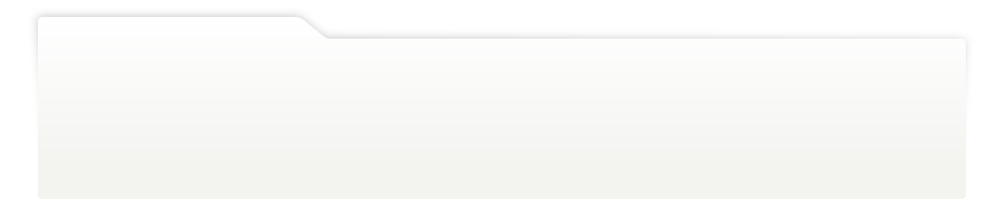
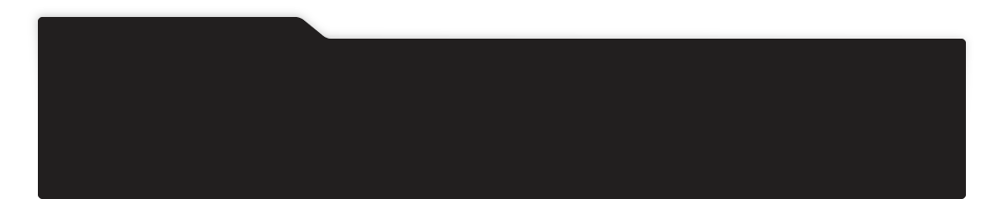
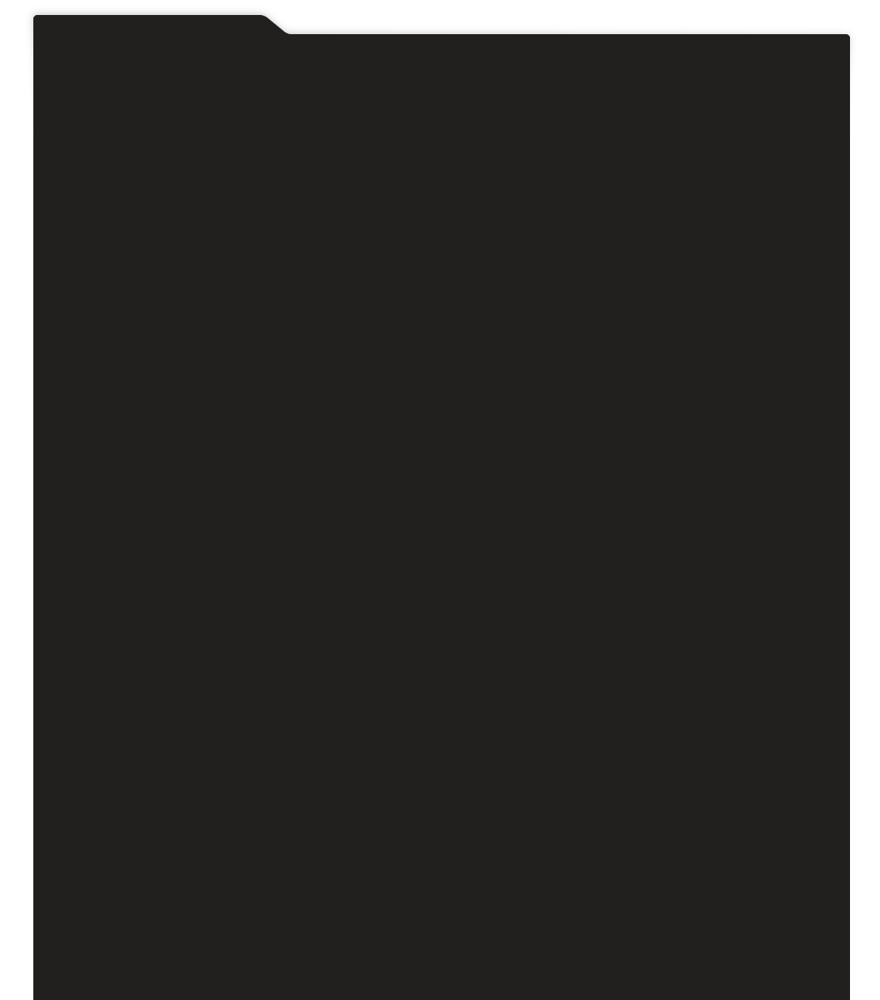
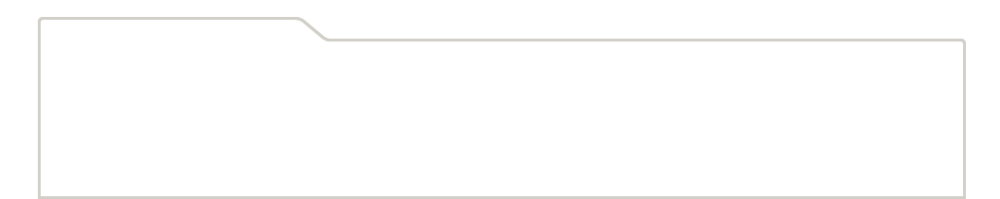
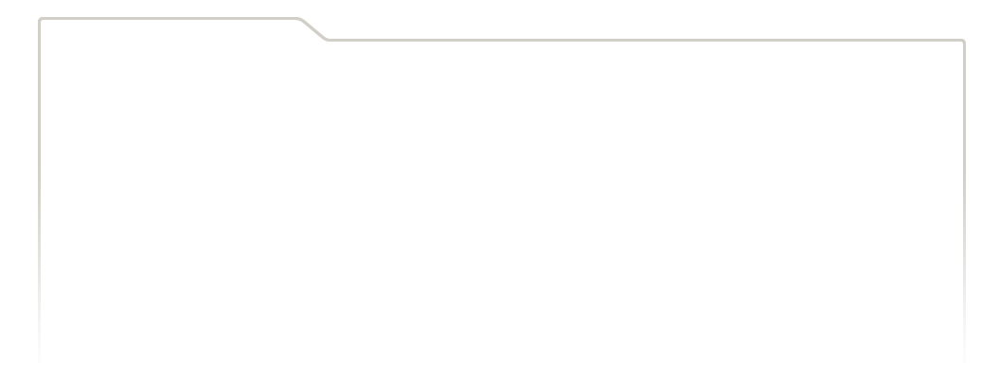
...
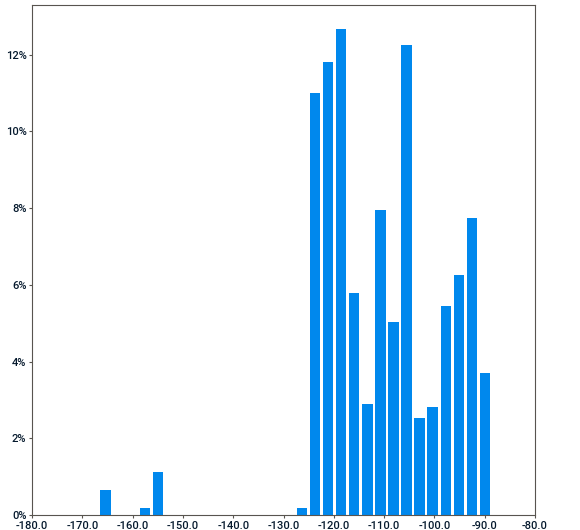
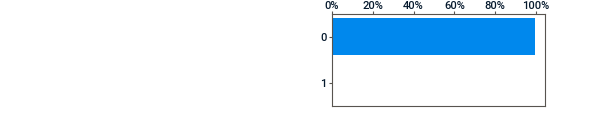
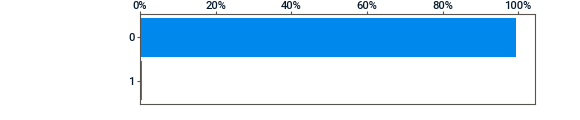
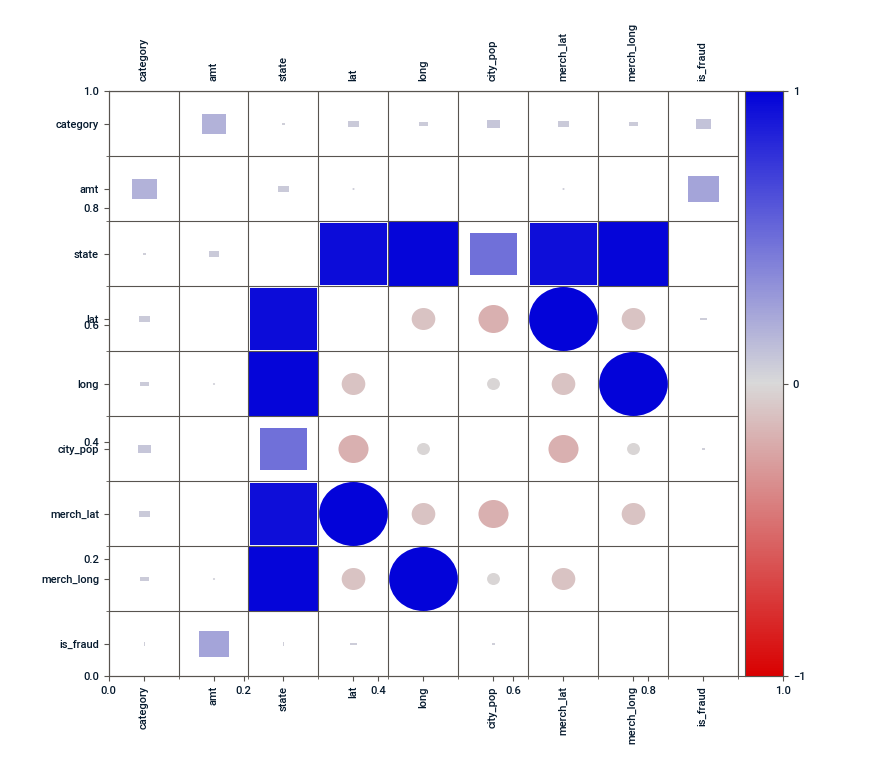
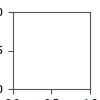

In [5]:
report = sweetviz.analyze(ccf)
report.show_notebook()

In [6]:
ccf.dtypes

trans_date_trans_time     object
merchant                  object
category                  object
amt                      float64
city                      object
state                     object
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
merch_lat                float64
merch_long               float64
is_fraud                   int64
dtype: object

### Initial Ideas for Feature Engineering

1. Create lag features of card usage in other locations, using moving averages with different time windows.
2. Create card holder age feature.
3. Create time related features, like hour, day of the week, month, year, etc.
4. Investigate high cardinality on variables 'merch_lat' and 'merch_long'.
5. (Optional) Cluster high cardinality features, like job, into smaller groups, using a clustering technique. This is optional because Target Encoding should be strong enough to deal with this type of data, but it could be worth trying grouping the data points into smaller bins.

### Inspection per frauded card holder

**Idea**: Sample some frauded card holders and inspect for misconduct of behaviour patterns. We can plot in the map the places that the card holder usually buys products, and spot ideas for how to treat the fraud information.

In [7]:
# !pip install folium

In [8]:
import folium

m = folium.Map(location=(41.850033, -87.6500523), zoom_start=4)

In [9]:
m

### Creation of Person ID
First we will create a Identification Key to allow us to trace a profile for each person.

The key will have the format: dob_city_job

In [10]:
df = ccf.copy()

In [11]:
df['ID'] = df.apply(lambda x: x['dob'] + '_' + x['city'] + '_' + x['job'], axis=1)

In [12]:
df.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
0,2019-01-01 00:00:44,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0,1978-06-21_Orient_Special educational needs te...
1,2019-01-01 00:00:51,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0,1962-01-19_Malad City_Nature conservation officer
2,2019-01-01 00:07:27,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0,1945-12-21_Grenada_Systems analyst
3,2019-01-01 00:09:03,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,0,1967-08-30_High Rolls Mountain Park_Naval arch...
4,2019-01-01 00:21:32,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,0,"1967-08-02_Freedom_Education officer, museum"


In [13]:
df['ID'].unique().size

187

**Key Takeway**

This gives us approximately 187 unique credit card holders. It is possible that a misrepresentation exists, but it is very unlikely.

### Credit card holder fraud distribution

We will now check how many credit card holders are frauded in this dataset.

In [14]:
df_credit_card_holders = pd.DataFrame(pd.DataFrame(df[['ID', 'is_fraud']].value_counts()).sort_values(by=['ID', 'is_fraud']))

In [15]:
df_credit_card_holders

count
ID                                            is_fraud       
1927-09-09_June Lake_Health service manager   0          2187
                                              1             6
1928-04-02_Howells_Research scientist (maths) 0          2174
                                              1            11
1928-10-01_Sixes_Retail merchandiser          0          1456
...                                                       ...
1999-11-30_Phoenix_Counselling psychologist   0          2916
                                              1            15
2000-08-16_Ruidoso_Licensed conveyancer       0          2188
                                              1            10
2001-07-26_Ballwin_Engineer, communications   0          2190

[351 rows x 1 columns]

In [16]:
df_credit_card_holders = df_credit_card_holders.reset_index()

In [17]:
total_card_holders = len(df_credit_card_holders['ID'].unique())
count_frauded_holders = 0

for card_holder_id in set(df_credit_card_holders['ID'].values):
    if df_credit_card_holders.loc[df_credit_card_holders['is_fraud'].astype(str) == '1'].shape[0] >= 1:
        count_frauded_holders += 1

print("Total amount of card holders: ", total_card_holders)
print("Amout of frauded card holders: ", count_frauded_holders)
print("Ratio of frauded holders: ", count_frauded_holders / total_card_holders)

Total amount of card holders:  187
Amout of frauded card holders:  187
Ratio of frauded holders:  1.0


**Key Takeaway**

All card holders from this dataset were victims of a credit card fraud.

### Fraud Victim Profile Mapping

We will anaylze some fraud samples, per victim, to validate and create new ideas for feature engineering.

In [18]:
df.loc[df['ID'] == '1950-08-19_Holstein_Telecommunications researcher']

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
23,2019-01-01 01:23:17,Kerluke Inc,misc_net,1.47,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,6569a85a160476c677bf9a4c2da40cfd,41.144860,-99.387620,0,1950-08-19_Holstein_Telecommunications researcher
65,2019-01-01 04:03:53,Brekke and Sons,gas_transport,84.58,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,946ab3d0eaf1a37f11668ae3c1d55a2c,40.310753,-99.581023,0,1950-08-19_Holstein_Telecommunications researcher
153,2019-01-01 09:36:48,"Tillman, Dickinson and Labadie",gas_transport,73.79,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,0b454b130b75c6519810ab0c65c01c88,40.625055,-98.588171,0,1950-08-19_Holstein_Telecommunications researcher
186,2019-01-01 11:30:36,Bogisich Inc,grocery_pos,138.46,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,9e9a286743a7c3eedcf5d17b7c4ffed2,40.111240,-98.256852,0,1950-08-19_Holstein_Telecommunications researcher
188,2019-01-01 11:37:44,Roberts-Beahan,misc_pos,105.57,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,45a31220dadaeb21792d0224968b4896,41.266607,-99.508962,0,1950-08-19_Holstein_Telecommunications researcher
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338976,2020-12-31 01:42:22,Kuhic LLC,shopping_net,8.18,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,e41b7f3731eb436fa033a94ed4edf926,40.995573,-97.986133,0,1950-08-19_Holstein_Telecommunications researcher
339056,2020-12-31 05:47:22,Haley Group,misc_pos,9.38,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,aa59577d77b5792a398f57888232ee6e,40.754736,-98.037487,0,1950-08-19_Holstein_Telecommunications researcher
339177,2020-12-31 10:41:45,"Johnson, Runolfsdottir and Maye",misc_net,9.84,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,076f623f81808fa2ac0109a89f152d27,41.354977,-99.333447,0,1950-08-19_Holstein_Telecommunications researcher
339238,2020-12-31 13:04:57,"Conroy, Balistreri and Gorczany",health_fitness,47.64,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,974fe9d2a2ff98ded3b33923107c437d,41.053379,-97.725884,0,1950-08-19_Holstein_Telecommunications researcher


In [19]:
df.loc[(df['ID'] == '1950-08-19_Holstein_Telecommunications researcher') & (df['is_fraud'].astype(str) == '1')]

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
222571,2020-05-23 01:14:43,Kiehn-Emmerich,grocery_pos,342.42,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,7846de83075a0d761f1e423e3a1e80d5,41.298393,-98.537031,1,1950-08-19_Holstein_Telecommunications researcher
222770,2020-05-23 15:40:02,Wilkinson LLC,personal_care,48.07,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,790104bd7111816da1f3760b037de4fc,40.094864,-98.891507,1,1950-08-19_Holstein_Telecommunications researcher
223188,2020-05-24 12:52:07,"Heathcote, Yost and Kertzmann",shopping_net,928.15,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,7bec4f4c82567e8b9d740bd5dcd72443,39.915056,-97.687228,1,1950-08-19_Holstein_Telecommunications researcher
223212,2020-05-24 13:52:18,"Bernhard, Grant and Langworth",shopping_pos,804.93,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,710fe0033a5d8d8a0cac8c19227af139,41.196010,-97.919504,1,1950-08-19_Holstein_Telecommunications researcher
223453,2020-05-24 22:02:33,Kerluke PLC,misc_net,682.36,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,782f591a0491bb96cc853edc61f8e337,39.762093,-98.910036,1,1950-08-19_Holstein_Telecommunications researcher
223462,2020-05-24 22:14:43,McGlynn-Heathcote,misc_net,749.36,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,9f18b117caa8811b25d8e1bef46d9b7e,40.381260,-98.282526,1,1950-08-19_Holstein_Telecommunications researcher
223476,2020-05-24 22:34:48,Klocko LLC,misc_net,860.50,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,64d4e4945e7de82b55dd85071c5f67d4,39.623349,-98.622642,1,1950-08-19_Holstein_Telecommunications researcher
223494,2020-05-24 23:11:17,Stamm-Witting,shopping_net,973.54,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,dc635a9d94c18d0656b68e1cd74fde58,41.449755,-98.669799,1,1950-08-19_Holstein_Telecommunications researcher
223504,2020-05-24 23:28:01,Brown PLC,misc_net,837.39,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,5a979563946c3cbaf9188070d9e8bba0,40.008809,-99.652165,1,1950-08-19_Holstein_Telecommunications researcher


In [20]:
df.loc[(df['ID'] == '1950-08-19_Holstein_Telecommunications researcher') & (df['merchant'] == 'Kiehn-Emmerich')]

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
3814,2019-01-13 10:27:40,Kiehn-Emmerich,grocery_pos,148.93,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,852214672d28ac5b45c4bf4b51fe15b4,39.908568,-98.515511,0,1950-08-19_Holstein_Telecommunications researcher
81785,2019-07-17 02:38:59,Kiehn-Emmerich,grocery_pos,83.07,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,18a5a7b7de78e763acba9666f465aa0b,40.997748,-98.999025,0,1950-08-19_Holstein_Telecommunications researcher
132053,2019-11-03 00:15:10,Kiehn-Emmerich,grocery_pos,138.10,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,bb9b5fc1d4e6904e24458b121434f3f9,40.470397,-98.281543,0,1950-08-19_Holstein_Telecommunications researcher
132722,2019-11-04 03:45:46,Kiehn-Emmerich,grocery_pos,118.21,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,9ff756237a088a92310d3f76f2de85e5,41.286046,-97.831014,0,1950-08-19_Holstein_Telecommunications researcher
187471,2020-02-26 00:52:19,Kiehn-Emmerich,grocery_pos,105.56,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,364734fcf654678b4722aef35c6984f1,41.385323,-98.257733,0,1950-08-19_Holstein_Telecommunications researcher
222571,2020-05-23 01:14:43,Kiehn-Emmerich,grocery_pos,342.42,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,7846de83075a0d761f1e423e3a1e80d5,41.298393,-98.537031,1,1950-08-19_Holstein_Telecommunications researcher
300800,2020-11-01 10:25:15,Kiehn-Emmerich,grocery_pos,144.21,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,59c131eb2312a292f93b09186eef4062,39.455933,-99.208765,0,1950-08-19_Holstein_Telecommunications researcher
310987,2020-11-25 01:35:52,Kiehn-Emmerich,grocery_pos,123.01,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,7860aa917a956a5c13402df005f1e701,39.701957,-98.557931,0,1950-08-19_Holstein_Telecommunications researcher


In [21]:
df.loc[(df['ID'] == '1950-08-19_Holstein_Telecommunications researcher') & (df['merchant'] == 'Heathcote, Yost and Kertzmann')]

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
8903,2019-01-29 07:18:02,"Heathcote, Yost and Kertzmann",shopping_net,28.40,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,92f358bffaa0ebce6ae2a4d29951cc9b,39.714062,-98.262668,0,1950-08-19_Holstein_Telecommunications researcher
56177,2019-05-28 04:28:18,"Heathcote, Yost and Kertzmann",shopping_net,5.96,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,2116296ff004a9cfcf313112c463ec2b,41.121928,-99.595577,0,1950-08-19_Holstein_Telecommunications researcher
208581,2020-04-19 03:07:06,"Heathcote, Yost and Kertzmann",shopping_net,37.43,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,6ab612c9169ccb7ce44f6a10804dac6a,41.246890,-98.227937,0,1950-08-19_Holstein_Telecommunications researcher
223188,2020-05-24 12:52:07,"Heathcote, Yost and Kertzmann",shopping_net,928.15,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,7bec4f4c82567e8b9d740bd5dcd72443,39.915056,-97.687228,1,1950-08-19_Holstein_Telecommunications researcher


In [22]:
df.loc[(df['ID'] == '1950-08-19_Holstein_Telecommunications researcher') & (df['merchant'] == 'Wilkinson LLC')]

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
161411,2019-12-21 22:43:48,Wilkinson LLC,personal_care,29.38,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,372215438289f85d75d816ee61cd6d29,39.576733,-99.514469,0,1950-08-19_Holstein_Telecommunications researcher
222770,2020-05-23 15:40:02,Wilkinson LLC,personal_care,48.07,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,790104bd7111816da1f3760b037de4fc,40.094864,-98.891507,1,1950-08-19_Holstein_Telecommunications researcher
227117,2020-05-31 23:43:58,Wilkinson LLC,personal_care,27.65,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,9df2a80a60f0268605074678190a3043,39.567785,-98.396918,0,1950-08-19_Holstein_Telecommunications researcher
255396,2020-07-24 23:50:51,Wilkinson LLC,personal_care,73.63,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,3d589e54c95a34f50a8b4436584014f8,40.592422,-99.255785,0,1950-08-19_Holstein_Telecommunications researcher
290643,2020-10-06 22:42:15,Wilkinson LLC,personal_care,11.57,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,c2a0a1c7086960a15e26b135956c95d5,40.514296,-98.845513,0,1950-08-19_Holstein_Telecommunications researcher
297332,2020-10-23 16:26:45,Wilkinson LLC,personal_care,56.51,Holstein,NE,40.4542,-98.6538,331,Telecommunications researcher,1950-08-19,36773f0d072c4e4c8dc85c3d488ee75d,40.886762,-99.506862,0,1950-08-19_Holstein_Telecommunications researcher


In [23]:
df.loc[df['ID'] == '1982-02-11_Sutherland_Insurance broker']

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
239,2019-01-01 13:43:35,Hermann-Gaylo,misc_pos,7.28,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,98f5e67e90c4fcad42b8a4e8e0428886,40.219185,-100.170155,0,1982-02-11_Sutherland_Insurance broker
281,2019-01-01 15:34:14,Beier and Sons,home,26.82,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,46f723b08e6c93c1160a067a3b05914f,40.998097,-100.389208,0,1982-02-11_Sutherland_Insurance broker
304,2019-01-01 16:18:49,Marvin-Lin,personal_care,4.67,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,fcb1551665e9e7b4a50c3e7894380760,41.501008,-100.762553,0,1982-02-11_Sutherland_Insurance broker
396,2019-01-01 20:54:45,Torphy-Kertzmann,health_fitness,159.44,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,d6edc00de359979b84ea826456586119,41.675729,-101.703298,0,1982-02-11_Sutherland_Insurance broker
489,2019-01-02 03:05:14,Emard Inc,gas_transport,35.27,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,8c997b585c1e321643c49ec2e17e68ad,41.341091,-101.754652,0,1982-02-11_Sutherland_Insurance broker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339433,2020-12-31 18:50:22,Bruen-Yost,misc_pos,2.62,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,31c38402797fde31541e2c22c65d3837,40.879467,-101.420469,0,1982-02-11_Sutherland_Insurance broker
339485,2020-12-31 20:21:49,Kuhic LLC,shopping_net,8.93,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,d7d9fd1c1684a4659927680e087b02e9,40.250712,-100.526165,0,1982-02-11_Sutherland_Insurance broker
339496,2020-12-31 20:39:05,Jakubowski Group,food_dining,1.16,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,3fc2a8b3fcbd59c8e548e9c90b103469,40.517098,-100.263656,0,1982-02-11_Sutherland_Insurance broker
339577,2020-12-31 23:14:42,"Reichert, Shanahan and Hayes",shopping_net,9.85,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,f62a21e7d2ee22b11da79a88bfeaa009,40.778536,-100.169758,0,1982-02-11_Sutherland_Insurance broker


In [24]:
df.loc[(df['ID'] == '1982-02-11_Sutherland_Insurance broker') & (df['is_fraud'].astype(str) == '1')]

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
262224,2020-08-07 00:03:32,Spencer-Runolfsson,misc_pos,714.17,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,4153c58ec1c1ed7567afe299b8477137,40.886500,-100.286657,1,1982-02-11_Sutherland_Insurance broker
262603,2020-08-07 22:27:48,Hermann and Sons,shopping_pos,1043.40,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,80a1a271990ee56b0c6d5e31013962ee,41.786423,-101.020784,1,1982-02-11_Sutherland_Insurance broker
262627,2020-08-07 23:23:52,"Nitzsche, Kessler and Wol",shopping_pos,1079.08,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,38633a56e0f918113fb9fba82fd55148,41.779142,-100.942277,1,1982-02-11_Sutherland_Insurance broker
262628,2020-08-07 23:26:47,"Lakin, Ferry and Beatty",food_dining,127.17,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,c9d60e46517a66d3fc31737736dd4e2f,41.550923,-100.194191,1,1982-02-11_Sutherland_Insurance broker
262631,2020-08-07 23:37:15,Swift PLC,kids_pets,22.62,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,18af4df0c5afda3d524cff8bb6ef5f92,40.457291,-101.045061,1,1982-02-11_Sutherland_Insurance broker
262633,2020-08-07 23:43:21,Friesen Lt,health_fitness,20.84,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,78f5e7b210280752236ec2347977c917,40.450803,-101.814364,1,1982-02-11_Sutherland_Insurance broker
262675,2020-08-08 02:02:02,"Stanton, Jakubowski and Baumbach",shopping_net,1107.33,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,563f710e03fe0a2e06eebeb46307bbaf,40.427648,-100.746378,1,1982-02-11_Sutherland_Insurance broker
262677,2020-08-08 02:07:47,"Altenwerth, Cartwright and Koss",shopping_net,882.83,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,ed037bf9087620bade94230a48f44a84,42.010574,-102.108069,1,1982-02-11_Sutherland_Insurance broker
262680,2020-08-08 02:13:13,Kutch and Sons,grocery_pos,358.55,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,398c9d221d4fb18eaff5af1007044de0,41.571712,-101.868459,1,1982-02-11_Sutherland_Insurance broker
262681,2020-08-08 02:13:59,Pacocha-Bauch,shopping_pos,1051.31,Sutherland,NE,41.1558,-101.136,1789,Insurance broker,1982-02-11,f2168997827ec90bb1c46ef25dbfc8dd,42.080129,-101.566291,1,1982-02-11_Sutherland_Insurance broker


**Key Takeaways**

- Fast paced lagged features are very likely to be useful to the fraud predictions.
- Our train-validation-test split must be done in a way that separates different card holders randomly.

### Product Category with most fraud histogram

<Axes: xlabel='category,is_fraud'>

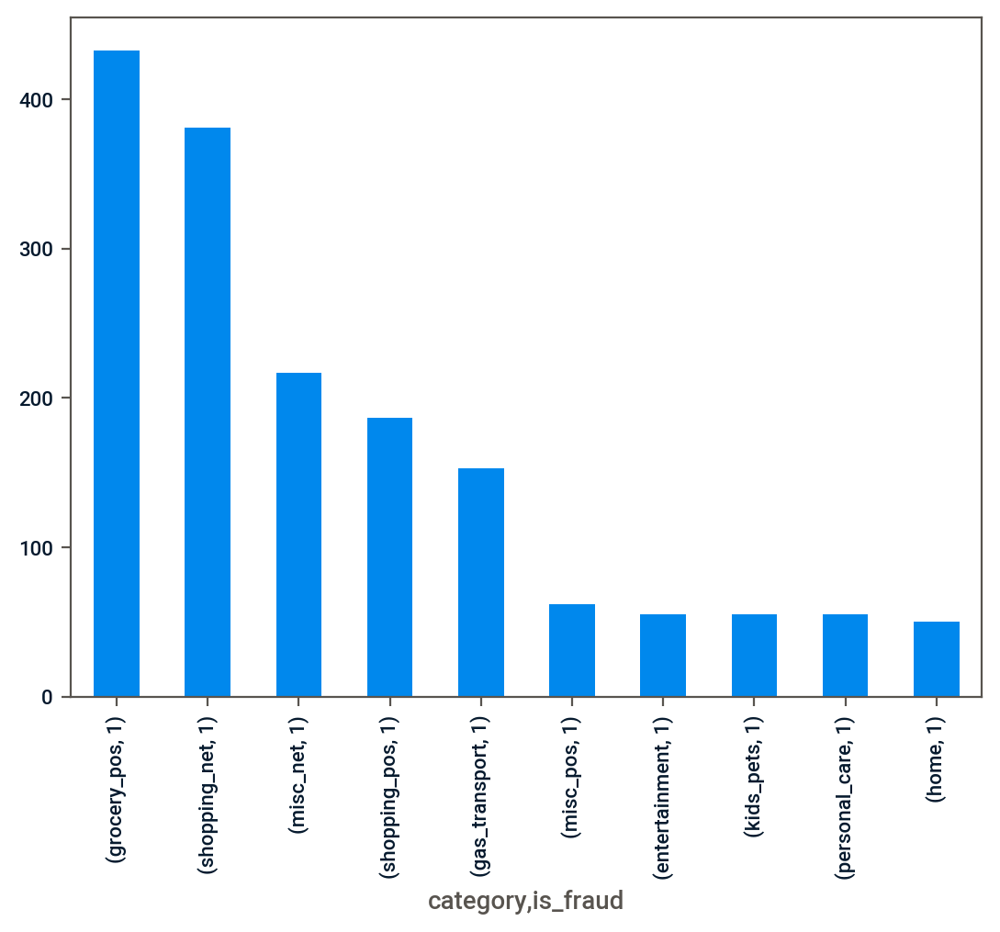

In [25]:
df[['category', 'is_fraud']].loc[df['is_fraud'].astype(str) == '1'].value_counts().iloc[:10].plot(kind='bar')

**Key Takeaway**

The product categories with most frauds are (top 3):
- Grocery (Point of Sale)
- Shopping (Internet)
- Misc (Internet)

### Fraud Geographic Map

In [26]:
df.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
0,2019-01-01 00:00:44,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0,1978-06-21_Orient_Special educational needs te...
1,2019-01-01 00:00:51,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0,1962-01-19_Malad City_Nature conservation officer
2,2019-01-01 00:07:27,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0,1945-12-21_Grenada_Systems analyst
3,2019-01-01 00:09:03,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,0,1967-08-30_High Rolls Mountain Park_Naval arch...
4,2019-01-01 00:21:32,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,0,"1967-08-02_Freedom_Education officer, museum"


In [27]:
df[['is_fraud']].value_counts()

is_fraud
0           337825
1             1782
Name: count, dtype: int64

In [28]:
df_map = df[['merch_lat', 'merch_long', 'is_fraud']]

In [29]:
df_map = df_map.reset_index()[['merch_lat', 'merch_long', 'is_fraud']]

In [30]:
df_map.head(3)

,merch_lat,merch_long,is_fraud
0,49.159047,-118.186462,0
1,43.150704,-112.154481,0
2,41.657520,-122.230347,0


In [31]:
df_map_sample = df_map.loc[df_map['is_fraud'].astype(str) == '1'].sample(n=1782, random_state=42)
print(f"{df_map_sample.shape=}")
df_map_sample = pd.concat([df_map_sample, df_map.loc[df_map['is_fraud'].astype(str) == '0'].sample(n=int(1782 * 2), random_state=42)])
print(f"{df_map_sample.shape=}")

df_map_sample.shape=(1782, 3)
df_map_sample.shape=(5346, 3)


In [32]:
df_map_sample.head()

,merch_lat,merch_long,is_fraud
130974,42.855154,-121.490318,1
262628,41.550923,-100.194191,1
24790,41.268673,-110.092197,1
124358,47.389921,-116.301184,1
123219,40.137422,-98.710192,1


In [33]:
m = folium.Map(location=(41.850033, -87.6500523), zoom_start=4)

In [34]:
for index, row in df_map_sample.iterrows():
    if row['is_fraud'] == 1:
        folium.CircleMarker(location=[row['merch_lat'], row['merch_long']], radius=5, color='red', fill=True, fill_color='red').add_to(m)
    elif row['is_fraud'] == 0:
        folium.CircleMarker(location=[row['merch_lat'], row['merch_long']], radius=5, color='green', fill=True, fill_color='red').add_to(m)

In [35]:
m

**Key Takeaway**

Based on the map analysis:
- Some regions far from centers are slightly more likely to be a fraud.
- Some frauds are concentrated in local clusters.
- There is an entire cluster in Alaska territory that is labeled as fraud.

### Credit Card Holders Age Correlation Analysis

In [36]:
df.head(3)

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID
0,2019-01-01 00:00:44,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0,1978-06-21_Orient_Special educational needs te...
1,2019-01-01 00:00:51,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0,1962-01-19_Malad City_Nature conservation officer
2,2019-01-01 00:07:27,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0,1945-12-21_Grenada_Systems analyst


In [37]:
today = pd.Timestamp.today()
df['dob'] = pd.to_datetime(df['dob'])
df['age'] = df['dob'].apply(
    lambda dob: today.year - dob.year - ((today.month, today.day) < (dob.month, dob.day))
)

In [38]:
df.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud,ID,age
0,2019-01-01 00:00:44,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,0,1978-06-21_Orient_Special educational needs te...,46
1,2019-01-01 00:00:51,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,0,1962-01-19_Malad City_Nature conservation officer,63
2,2019-01-01 00:07:27,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,0,1945-12-21_Grenada_Systems analyst,79
3,2019-01-01 00:09:03,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,0,1967-08-30_High Rolls Mountain Park_Naval arch...,57
4,2019-01-01 00:21:32,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,0,"1967-08-02_Freedom_Education officer, museum",57


In [39]:
def distribute_bins(number):
    return int((number // 10) * 10)

In [40]:
distribute_bins(79)

70

In [41]:
df['age_binned'] = df['age'].apply(lambda x: distribute_bins(x))

<Axes: xlabel='age_binned'>

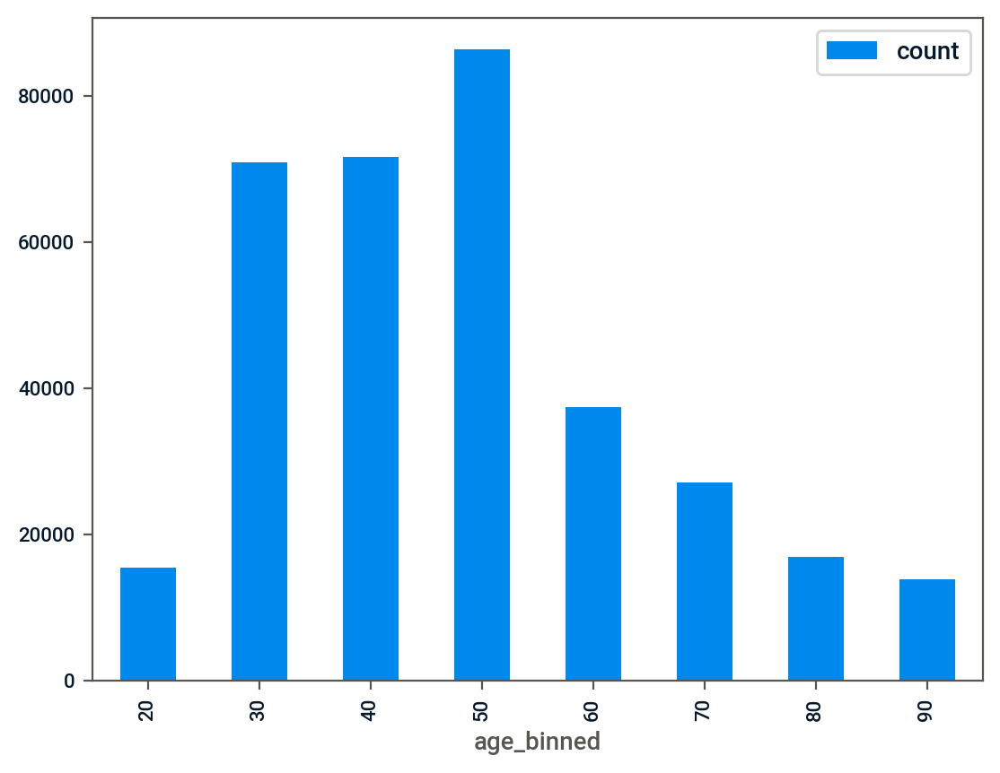

In [42]:
df_age = df[['age_binned']].value_counts().reset_index().sort_values(by='age_binned')
df_age.plot(x='age_binned',y='count', kind='bar')

<Axes: xlabel='age_binned'>

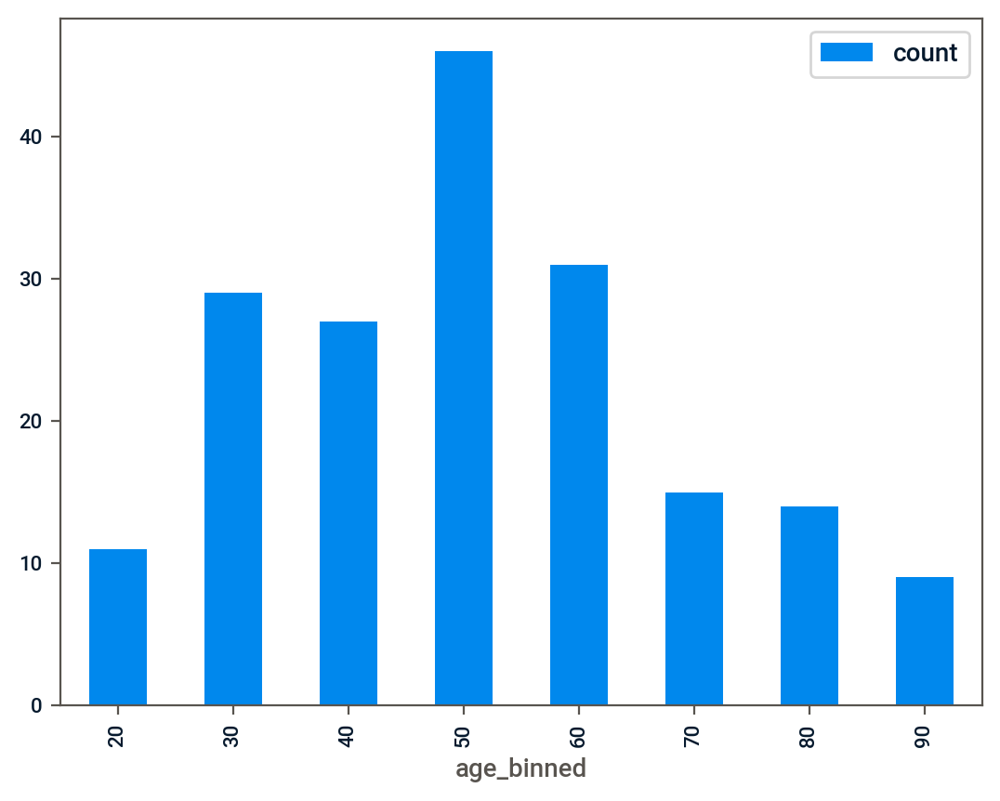

In [43]:
df_age = df.loc[df['is_fraud'] == 1][['ID', 'age_binned', 'is_fraud']].drop_duplicates()[['age_binned']].value_counts().reset_index().sort_values(by='age_binned')
df_age.plot(x='age_binned',y='count', kind='bar')

**Key Takeaway**

The most likely to be frauded victims have an respective age of:

- 1st place: 50 years old
- 2nd place: 60 years old
- 3rd place: 30 years old

### Exploratory Data Analysis - Wrap Up

- Lagged features is a good idea indeed! There seems to be a pattern correlating money amount of transaction between current time step and previous.
- Merch Latitude and Longitude revealed that some frauds are frequent in isolated areas. If the model learns these areas, it could reflect gain in predictive performance.
- Age feature, which we created, is very likely to be important, given the uneven histogram we found.
- We MUST do a smart training, validation and test split, in order for the model to have relevant predictive power.

## Feature Engineering

### Creation of periodic timestamp

It is necessary to create a consistent timestamp column, for model training and creating lag features.

In [44]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

In [45]:
df['dt_ref_15min'] = df['trans_date_trans_time'].dt.floor('15min')

### Reorganizing columns order

In [46]:
# Moves created column to 2nd column position.
col_to_move = 'dt_ref_15min'

cols = df.columns.tolist()
cols.remove(col_to_move)
cols.insert(1, col_to_move)

df = df[cols]

In [47]:
# Moves ID column to 1st column position.
col_to_move = 'ID'

cols = df.columns.tolist()
cols.remove(col_to_move)
cols.insert(0, col_to_move)

df = df[cols]

In [48]:
# Moves target column to last position.
col_to_move = 'is_fraud'

cols = df.columns.tolist()
cols.remove(col_to_move)
cols.insert(df.shape[1], col_to_move)

df = df[cols]

In [49]:
df.head()

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud
0,1978-06-21_Orient_Special educational needs te...,2019-01-01 00:00:44,2019-01-01 00:00:00,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,46,40,0
1,1962-01-19_Malad City_Nature conservation officer,2019-01-01 00:00:51,2019-01-01 00:00:00,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,63,60,0
2,1945-12-21_Grenada_Systems analyst,2019-01-01 00:07:27,2019-01-01 00:00:00,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,79,70,0
3,1967-08-30_High Rolls Mountain Park_Naval arch...,2019-01-01 00:09:03,2019-01-01 00:00:00,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,57,50,0
4,"1967-08-02_Freedom_Education officer, museum",2019-01-01 00:21:32,2019-01-01 00:15:00,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,57,50,0


### Train / Validation / Test Data Split

I will perform a random split over the credit card holders. This way we can correctly create lag features, based on past behaviour for each person, instead of the data being a "soup" of statistical noise.

In [50]:
unique_card_holders = list(df['ID'].unique())

In [51]:
def train_test_split_per_id(df, unique_ids):
    import numpy as np
    values = ['TRAIN', 'VALID', 'TEST']
    probs = [0.8, 0.1, 0.1]
    shape_df = df.shape

    def pick_value_randomly():
        return np.random.choice(values, p=probs)

    assert isinstance(unique_ids, list), "Variable 'unique_ids' needs to be a list."
    df_unique_holders = pd.DataFrame(
        {
            'ID': unique_ids
        }
    )

    print("Performing training, validation, test split...")
    df_unique_holders['type'] = df_unique_holders['ID'].apply(lambda _: pick_value_randomly())
    df_train_test_splitted = df.merge(df_unique_holders, how='left', on='ID').copy()
    assert df_train_test_splitted.shape == (shape_df[0], shape_df[1] + 1), "Merge operation is not consistent in shape."
    
    print("Split successful, returning...")
    return df_train_test_splitted

In [52]:
df_train_raw = train_test_split_per_id(df, unique_card_holders)

Performing training, validation, test split...
Split successful, returning...


### Split validation

I will check if the train test split is valid.

In [53]:
df_train_raw.sort_values(by='ID').head(10)

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud,type
337699,1927-09-09_June Lake_Health service manager,2020-12-29 11:38:16,2020-12-29 11:30:00,Kutch LLC,gas_transport,55.01,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,bdd4afca06bb1a3b4974a6982f94999b,38.580258,-118.918543,97,90,0,TRAIN
174892,1927-09-09_June Lake_Health service manager,2020-01-17 09:54:14,2020-01-17 09:45:00,Koss and Sons,gas_transport,66.97,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,d7d8b784e39d8e88b04c65b593007095,37.992631,-119.217664,97,90,0,TRAIN
17087,1927-09-09_June Lake_Health service manager,2019-02-24 20:34:56,2019-02-24 20:30:00,Gulgowski LLC,home,98.11,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,861dcd79d1f0b1f575ef9338a55dc0ff,37.092661,-118.847442,97,90,0,TRAIN
311228,1927-09-09_June Lake_Health service manager,2020-11-25 23:40:40,2020-11-25 23:30:00,"Medhurst, Labadie and Gottlieb",travel,5.28,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,327fba87708cf9bb77532affcf584211,38.060818,-118.209147,97,90,0,TRAIN
55261,1927-09-09_June Lake_Health service manager,2019-05-26 20:17:57,2019-05-26 20:15:00,Dare-Marvin,entertainment,12.75,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,94236cdce57090e81e6e745988f943de,38.750592,-119.728572,97,90,0,TRAIN
301194,1927-09-09_June Lake_Health service manager,2020-11-02 03:25:48,2020-11-02 03:15:00,Parisian and Sons,gas_transport,50.40,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,abdafb3b7b1a548140f20cdd153339c4,38.214643,-119.662498,97,90,0,TRAIN
295217,1927-09-09_June Lake_Health service manager,2020-10-18 18:34:56,2020-10-18 18:30:00,Bins-Tillman,entertainment,94.94,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,061973b06d201215ed3ee4304fe34318,38.060202,-118.805541,97,90,0,TRAIN
209089,1927-09-09_June Lake_Health service manager,2020-04-20 02:55:04,2020-04-20 02:45:00,Hills-Witting,shopping_net,2.10,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,d5386a8b43de63b9fc73ce46596f7fdc,36.948685,-118.332149,97,90,0,TRAIN
176700,1927-09-09_June Lake_Health service manager,2020-01-22 17:56:40,2020-01-22 17:45:00,Romaguera and Sons,travel,5.11,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,528be65c76fe7ab2cfb7f6448e8053e4,36.880492,-119.534351,97,90,0,TRAIN
285270,1927-09-09_June Lake_Health service manager,2020-09-24 15:21:33,2020-09-24 15:15:00,Schumm PLC,health_fitness,15.66,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,27b2070789710e7b56c89d50cc9d1255,37.089217,-119.878148,97,90,0,TRAIN


In [54]:
df_train_raw.loc[df_train_raw['ID'] == '1927-09-09_June Lake_Health service manager']

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud,type
21,1927-09-09_June Lake_Health service manager,2019-01-01 01:22:56,2019-01-01 01:15:00,Fisher-Schowalte,shopping_net,226.33,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,208e003f309f9db37b3c40ddc9271908,36.819789,-119.670559,97,90,0,TRAIN
117,1927-09-09_June Lake_Health service manager,2019-01-01 07:43:51,2019-01-01 07:30:00,McDermott-Weimann,grocery_pos,150.82,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,d4175d076783f76299e010c158b2b6c7,38.179302,-119.614224,97,90,0,TRAIN
389,1927-09-09_June Lake_Health service manager,2019-01-01 20:26:39,2019-01-01 20:15:00,Bogisich-Weimann,kids_pets,141.46,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,4fed9d6795bb838bf11d80ed430efdf0,37.385819,-120.061873,97,90,0,TRAIN
521,1927-09-09_June Lake_Health service manager,2019-01-02 07:37:24,2019-01-02 07:30:00,Cole PLC,grocery_pos,108.50,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,dc219cdfb49b7dba3854fc4eef141968,38.733766,-118.876821,97,90,0,TRAIN
541,1927-09-09_June Lake_Health service manager,2019-01-02 10:04:43,2019-01-02 10:00:00,Frami Group,entertainment,27.70,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,884d5014909790e6e782e21a35c38727,38.130066,-119.710773,97,90,0,TRAIN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338843,1927-09-09_June Lake_Health service manager,2020-12-30 19:56:33,2020-12-30 19:45:00,Barton LLC,kids_pets,76.53,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,1a53931e6d483c2de3f7a2d052f0cc67,37.596376,-119.782762,97,90,0,TRAIN
338967,1927-09-09_June Lake_Health service manager,2020-12-31 01:16:05,2020-12-31 01:15:00,Auer-West,shopping_net,75.42,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,3d23b42fa3d5a24fc823a9832e4bc385,36.824212,-119.840930,97,90,0,TRAIN
338974,1927-09-09_June Lake_Health service manager,2020-12-31 01:38:07,2020-12-31 01:30:00,Medhurst PLC,shopping_net,9.92,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,56acc14348268fe5a9747b476dda7c95,38.395807,-118.439135,97,90,0,TRAIN
339017,1927-09-09_June Lake_Health service manager,2020-12-31 03:58:32,2020-12-31 03:45:00,Hudson-Grady,shopping_pos,9.17,June Lake,CA,37.7773,-119.0825,633,Health service manager,1927-09-09,d8c4d9a930f508452d1cd0e74a543c00,36.856354,-118.137255,97,90,0,TRAIN


In [55]:
df_train_raw.loc[df_train_raw['type'] == 'VALID'].sort_values(by='ID').head(10)

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud,type
226201,"1929-05-06_Fields Landing_Scientist, audiological",2020-05-30 08:16:50,2020-05-30 08:15:00,"Robel, Cummerata and Prosacco",gas_transport,74.14,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,57804a97583bc2ffb6843a517ee88299,39.843235,-125.184110,96,90,0,VALID
49736,"1929-05-06_Fields Landing_Scientist, audiological",2019-05-13 19:13:35,2019-05-13 19:00:00,"Larson, Quitzon and Spence",travel,1.64,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,016b76891376e80f33ce165d8634519d,41.532015,-124.698133,96,90,0,VALID
49822,"1929-05-06_Fields Landing_Scientist, audiological",2019-05-13 22:29:54,2019-05-13 22:15:00,Connelly PLC,food_dining,25.24,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,2eaf8b26f2a1408debcd5b8a26710693,40.518458,-123.353056,96,90,0,VALID
241934,"1929-05-06_Fields Landing_Scientist, audiological",2020-06-29 09:58:23,2020-06-29 09:45:00,Berge LLC,gas_transport,65.61,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,35551571d616e314f421b3ee76af23f1,41.723984,-125.095100,96,90,0,VALID
50023,"1929-05-06_Fields Landing_Scientist, audiological",2019-05-14 17:01:51,2019-05-14 17:00:00,Erdman-Ebert,personal_care,16.23,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,b2f9e8e3aa71a649d5e810eaaafc70d3,41.380443,-123.717939,96,90,0,VALID
241736,"1929-05-06_Fields Landing_Scientist, audiological",2020-06-29 02:58:24,2020-06-29 02:45:00,Ledner-Pfannerstill,gas_transport,52.05,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,b32a9cb17f159d577f3bdd29eb06b7aa,40.215147,-125.047382,96,90,0,VALID
50085,"1929-05-06_Fields Landing_Scientist, audiological",2019-05-14 21:27:09,2019-05-14 21:15:00,"Feil, Hilpert and Koss",food_dining,97.49,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,876ed7fd65042c6a1e909d67e9ce6aba,40.093273,-123.972243,96,90,0,VALID
241705,"1929-05-06_Fields Landing_Scientist, audiological",2020-06-29 01:35:44,2020-06-29 01:30:00,"Towne, Greenholt and Koepp",shopping_net,593.74,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,ba26800647b3b05fb50e6ff03d4fc1be,41.500661,-123.838789,96,90,0,VALID
50118,"1929-05-06_Fields Landing_Scientist, audiological",2019-05-15 00:03:22,2019-05-15 00:00:00,"Schuppe, Nolan and Hoege",shopping_pos,9.58,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,c46fc49031aa5f23541621e700e742fc,40.836997,-123.257961,96,90,0,VALID
241617,"1929-05-06_Fields Landing_Scientist, audiological",2020-06-28 22:14:28,2020-06-28 22:00:00,Bins-Howell,personal_care,158.48,Fields Landing,CA,40.7268,-124.2174,276,"Scientist, audiological",1929-05-06,8e21a77fc9799b5d191f3f3a938f96c4,40.945232,-123.641254,96,90,0,VALID


In [56]:
df_train_raw.loc[df_train_raw['ID'] == '1928-04-02_Howells_Research scientist (maths)']

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud,type
513,1928-04-02_Howells_Research scientist (maths),2019-01-02 06:39:41,2019-01-02 06:30:00,"Olson, Becker and Koch",gas_transport,67.42,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,a9b5c5cc7fbe7944d68af122322a7d0f,41.929427,-97.644914,97,90,0,TEST
593,1928-04-02_Howells_Research scientist (maths),2019-01-02 16:28:03,2019-01-02 16:15:00,Wilkinson PLC,kids_pets,146.60,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,ee46342583f2f25dd78f29b82412ee96,42.486036,-96.461106,97,90,0,TEST
798,1928-04-02_Howells_Research scientist (maths),2019-01-03 12:54:38,2019-01-03 12:45:00,Lynch-Wisozk,home,65.23,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,6ae93165c74392feef85bdae6f703447,41.796106,-97.490248,97,90,0,TEST
1303,1928-04-02_Howells_Research scientist (maths),2019-01-05 09:43:58,2019-01-05 09:30:00,"Wiza, Schaden and Stark",misc_pos,8.73,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,78308c26882774e7ed5a995798719f90,41.930333,-97.573855,97,90,0,TEST
1404,1928-04-02_Howells_Research scientist (maths),2019-01-05 18:08:46,2019-01-05 18:00:00,Friesen-Ortiz,personal_care,43.40,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,8d97677c9bd44d33537f32a54721f670,42.622206,-96.352611,97,90,0,TEST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339296,1928-04-02_Howells_Research scientist (maths),2020-12-31 14:54:21,2020-12-31 14:45:00,Lemke and Sons,travel,2.04,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,74837c40eaf753e778da9f30b03be6ea,40.945315,-97.030050,97,90,0,TEST
339388,1928-04-02_Howells_Research scientist (maths),2020-12-31 17:43:06,2020-12-31 17:30:00,Bernier and Sons,kids_pets,86.38,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,4bb8ffaf18b218c38f85f1dab90a331a,42.157633,-96.446248,97,90,0,TEST
339465,1928-04-02_Howells_Research scientist (maths),2020-12-31 19:38:34,2020-12-31 19:30:00,"O'Connell, Botsford and Han",home,146.79,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,602f5757f3ecd171beb457d8cb34bd47,42.237391,-97.526550,97,90,0,TEST
339491,1928-04-02_Howells_Research scientist (maths),2020-12-31 20:31:27,2020-12-31 20:30:00,"Reichel, Bradtke and Blan",travel,1.82,Howells,NE,41.6964,-96.9858,1063,Research scientist (maths),1928-04-02,54ba969fcdc3380bec193eaf73836d56,42.643403,-96.879872,97,90,0,TEST


In [57]:
df_train_raw['type'].value_counts()

type
TRAIN    279544
VALID     32199
TEST      27864
Name: count, dtype: int64

**Key Takeaway**

The train test split seems to be valid! Let's procced to Feature Creation.

### Lag Features Creation

I will iterate over each credit card holders' batch and generate the lagged features for model training.

In [58]:
# !pip install feature-engine

In [59]:
from feature_engine.timeseries.forecasting import LagFeatures


lag_f = LagFeatures(
    variables=["amt"],
    periods=[p for p in range(1, 11)],
    fill_value=0
)

# Example of lagged features.
X_tr = lag_f.fit_transform(df_train_raw)

In [60]:
X_tr.head()

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud,type,amt_lag_1,amt_lag_2,amt_lag_3,amt_lag_4,amt_lag_5,amt_lag_6,amt_lag_7,amt_lag_8,amt_lag_9,amt_lag_10
0,1978-06-21_Orient_Special educational needs te...,2019-01-01 00:00:44,2019-01-01 00:00:00,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,46,40,0,TRAIN,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0
1,1962-01-19_Malad City_Nature conservation officer,2019-01-01 00:00:51,2019-01-01 00:00:00,Lind-Buckridge,entertainment,220.11,Malad City,ID,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,43.150704,-112.154481,63,60,0,TRAIN,107.23,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0
2,1945-12-21_Grenada_Systems analyst,2019-01-01 00:07:27,2019-01-01 00:00:00,Kiehn Inc,grocery_pos,96.29,Grenada,CA,41.6125,-122.5258,589,Systems analyst,1945-12-21,413636e759663f264aae1819a4d4f231,41.657520,-122.230347,79,70,0,TRAIN,220.11,107.23,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0
3,1967-08-30_High Rolls Mountain Park_Naval arch...,2019-01-01 00:09:03,2019-01-01 00:00:00,Beier-Hyatt,shopping_pos,7.77,High Rolls Mountain Park,NM,32.9396,-105.8189,899,Naval architect,1967-08-30,8a6293af5ed278dea14448ded2685fea,32.863258,-106.520205,57,50,0,TRAIN,96.29,220.11,107.23,0.00,0.0,0.0,0.0,0.0,0.0,0.0
4,"1967-08-02_Freedom_Education officer, museum",2019-01-01 00:21:32,2019-01-01 00:15:00,Bruen-Yost,misc_pos,6.85,Freedom,WY,43.0172,-111.0292,471,"Education officer, museum",1967-08-02,f3c43d336e92a44fc2fb67058d5949e3,43.753735,-111.454923,57,50,0,TRAIN,7.77,96.29,220.11,107.23,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
# !pip install tqdm

In [62]:
from tqdm import tqdm


def generate_lagged_features(df_train_raw):
    lag_f_money = LagFeatures(
        variables=["amt"],
        periods=[p for p in range(1, 11)],
        fill_value=0
    )
    lag_f_time = LagFeatures(
        variables=["time_of_the_day", "day_of_the_month", "month"],
        periods=[p for p in range(1, 3)],
        fill_value=0
    )
    lag_f_category = LagFeatures(
        variables=["category_num", "merchant_num"],
        periods=[p for p in range(1, 3)],
        fill_value=0
    )
    lag_f_coordinates = LagFeatures(
        variables=["lat", "long", "merch_lat", "merch_long"],
        periods=[p for p in range(1, 3)],
        fill_value=0
    )

    cat_mapping_category = dict(enumerate(df_train_raw['category'].astype('category').cat.categories))
    df_train_raw['category_num'] = df_train_raw['category'].astype('category').cat.codes
    cat_mapping_merchant = dict(enumerate(df_train_raw['merchant'].astype('category').cat.categories))
    df_train_raw['merchant_num'] = df_train_raw['merchant'].astype('category').cat.codes

    print(df_train_raw[['category_num', 'merchant_num']].dtypes)
    print(df_train_raw[['category_num', 'merchant_num']].head())
    
    print("Generating time distance features...")
    df_train_raw['time_of_the_day'] = df_train_raw['trans_date_trans_time'].dt.hour * 60 + df_train_raw['trans_date_trans_time'].dt.minute
    df_train_raw['day_of_the_month'] = df_train_raw['trans_date_trans_time'].dt.day
    df_train_raw['month'] = df_train_raw['trans_date_trans_time'].dt.month

    df_train = pd.DataFrame(columns=df_train_raw.columns)

    print("Generating lagged features...")
    for unique_card_holder in tqdm(df_train_raw['ID'].unique(), total=len(df_train_raw['ID'].unique())):
        df_train_raw_filtered = df_train_raw.copy().loc[df_train_raw['ID'] == unique_card_holder]
        df_train_filtered_lag = lag_f_money.fit_transform(df_train_raw_filtered)
        df_train_filtered_lag = lag_f_time.fit_transform(df_train_filtered_lag)
        df_train_filtered_lag = lag_f_category.fit_transform(df_train_filtered_lag)
        df_train_filtered_lag = lag_f_coordinates.fit_transform(df_train_filtered_lag)
        df_train = pd.concat([df_train, df_train_filtered_lag])

    return df_train


In [63]:
df_train = generate_lagged_features(df_train_raw)

category_num     int8
merchant_num    int16
dtype: object
   category_num  merchant_num
0             4           241
1             0           390
2             4           308
3            12            42
4             9            82
Generating time distance features...
Generating lagged features...


100%|██████████| 187/187 [00:20<00:00,  9.06it/s]


In [64]:
print(df_train.shape)

(339607, 53)


In [65]:
df_train.head()

,ID,trans_date_trans_time,dt_ref_15min,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,age,age_binned,is_fraud,type,category_num,merchant_num,time_of_the_day,day_of_the_month,month,amt_lag_1,amt_lag_2,amt_lag_3,amt_lag_4,amt_lag_5,amt_lag_6,amt_lag_7,amt_lag_8,amt_lag_9,amt_lag_10,time_of_the_day_lag_1,day_of_the_month_lag_1,month_lag_1,time_of_the_day_lag_2,day_of_the_month_lag_2,month_lag_2,category_num_lag_1,merchant_num_lag_1,category_num_lag_2,merchant_num_lag_2,lat_lag_1,long_lag_1,merch_lat_lag_1,merch_long_lag_1,lat_lag_2,long_lag_2,merch_lat_lag_2,merch_long_lag_2
0,1978-06-21_Orient_Special educational needs te...,2019-01-01 00:00:44,2019-01-01 00:00:00,"Heller, Gutmann and Zieme",grocery_pos,107.23,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,49.159047,-118.186462,46,40,0,TRAIN,4,241,0,1,1,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.000000,0.000000,0.0000,0.0000,0.000000,0.000000
79,1978-06-21_Orient_Special educational needs te...,2019-01-01 04:57:58,2019-01-01 04:45:00,"Streich, Hansen and Veum",gas_transport,61.39,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,9825a8292f6b25bb7d54b253bb3336f6,48.394218,-117.363563,46,40,0,TRAIN,2,605,297,1,1,107.23,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,4.0,241.0,0.0,0.0,48.8878,-118.2105,49.159047,-118.186462,0.0000,0.0000,0.000000,0.000000
96,1978-06-21_Orient_Special educational needs te...,2019-01-01 06:24:47,2019-01-01 06:15:00,Harber Inc,gas_transport,94.48,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,c9235f76ecb45e67372d79ecac2ffb37,49.513555,-117.819653,46,40,0,TRAIN,2,229,384,1,1,61.39,107.23,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,297.0,1.0,1.0,0.0,1.0,1.0,2.0,605.0,4.0,241.0,48.8878,-118.2105,48.394218,-117.363563,48.8878,-118.2105,49.159047,-118.186462
278,1978-06-21_Orient_Special educational needs te...,2019-01-01 15:27:33,2019-01-01 15:15:00,"Romaguera, Wehner and Tromp",kids_pets,92.48,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,f16d17932951db1e8664b82c65fd0da9,48.491798,-117.466434,46,40,0,TRAIN,7,529,927,1,1,94.48,61.39,107.23,0.00,0.0,0.0,0.0,0.0,0.0,0.0,384.0,1.0,1.0,297.0,1.0,1.0,2.0,229.0,2.0,605.0,48.8878,-118.2105,49.513555,-117.819653,48.8878,-118.2105,48.394218,-117.363563
306,1978-06-21_Orient_Special educational needs te...,2019-01-01 16:26:25,2019-01-01 16:15:00,Hermann-Gaylo,misc_pos,1.93,Orient,WA,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,04a953c9601dd378f92d2b77c342e436,49.002189,-117.977232,46,40,0,TRAIN,9,247,986,1,1,92.48,94.48,61.39,107.23,0.0,0.0,0.0,0.0,0.0,0.0,927.0,1.0,1.0,384.0,1.0,1.0,7.0,529.0,2.0,229.0,48.8878,-118.2105,48.491798,-117.466434,48.8878,-118.2105,49.513555,-117.819653


## Model Training

### Main model

In [66]:
# !pip install catboost

In [67]:
from catboost import CatBoostClassifier, Pool
from sklearn.metrics import classification_report

In [68]:
cat_features = [
    'merchant_num', 'category_num', 'city', 'state', 'job'
]
num_features = [
    'amt', 'lat', 'long', 'city_pop', 'merch_lat', 'merch_long', 'age_binned', 'time_of_the_day', 'day_of_the_month', 'month'
]
lag_features = [
    'amt_lag_1',
    'amt_lag_2',
    'amt_lag_3',
    'amt_lag_4',
    'amt_lag_5',
    'amt_lag_6',
    'amt_lag_7',
    'amt_lag_8',
    'amt_lag_9',
    'amt_lag_10',
    'time_of_the_day_lag_1',
    'day_of_the_month_lag_1',
    'time_of_the_day_lag_2',
    'day_of_the_month_lag_2',
    'month_lag_1',
    'month_lag_2',
    'category_num_lag_1',
    'category_num_lag_2',
    'merchant_num_lag_1',
    'merchant_num_lag_2',
    'lat_lag_1',
    'lat_lag_2',
    'long_lag_1',
    'long_lag_2',
    'merch_lat_lag_1',
    'merch_lat_lag_2',
    'merch_long_lag_1',
    'merch_long_lag_2'
]
features = num_features + cat_features + lag_features
split_type_col = 'type'
target_col = 'is_fraud'

In [69]:
x_train, y_train = df_train.loc[df_train[split_type_col] == 'TRAIN'][features], df_train.loc[df_train[split_type_col] == 'TRAIN'][[target_col]]
train_pool = Pool(
    x_train,
    y_train,
    cat_features=cat_features
)

In [70]:
x_val, y_val = df_train.loc[df_train[split_type_col] == 'VALID'][features], df_train.loc[df_train[split_type_col] == 'VALID'][[target_col]]
val_pool = Pool(
    x_val,
    y_val,
    cat_features=cat_features
)

In [71]:
x_test, y_test = df_train.loc[df_train[split_type_col] == 'TEST'][features], df_train.loc[df_train[split_type_col] == 'TEST'][[target_col]]
test_pool = Pool(
    x_test,
    y_test,
    cat_features=cat_features
)

In [72]:
model = CatBoostClassifier(
    n_estimators=10000,
    max_depth=3,
    loss_function='Logloss',
    eval_metric='F1',
    class_weights=[1, 10],
    verbose=1
)

In [73]:
model.fit(
    train_pool,
    eval_set=val_pool,
    early_stopping_rounds=200
)

Learning rate set to 0.046793
0:	learn: 0.7844406	test: 0.8620690	best: 0.8620690 (0)	total: 236ms	remaining: 39m 23s
1:	learn: 0.7820777	test: 0.8623345	best: 0.8623345 (1)	total: 410ms	remaining: 34m 8s
2:	learn: 0.7862707	test: 0.8631319	best: 0.8631319 (2)	total: 605ms	remaining: 33m 37s
3:	learn: 0.7771762	test: 0.8522727	best: 0.8631319 (2)	total: 776ms	remaining: 32m 20s
4:	learn: 0.7930867	test: 0.8633981	best: 0.8633981 (4)	total: 955ms	remaining: 31m 49s
5:	learn: 0.7871447	test: 0.8604147	best: 0.8633981 (4)	total: 1.11s	remaining: 30m 51s
6:	learn: 0.7907933	test: 0.8701057	best: 0.8701057 (6)	total: 1.28s	remaining: 30m 27s
7:	learn: 0.7885752	test: 0.8701095	best: 0.8701095 (7)	total: 1.46s	remaining: 30m 18s
8:	learn: 0.7821745	test: 0.8593997	best: 0.8701095 (7)	total: 1.64s	remaining: 30m 15s
9:	learn: 0.7812434	test: 0.8563273	best: 0.8701095 (7)	total: 1.79s	remaining: 29m 45s
10:	learn: 0.7849557	test: 0.8599431	best: 0.8701095 (7)	total: 1.96s	remaining: 29m 38s
11

In [74]:
predictions = model.predict(test_pool)

In [75]:
predictions_val = model.predict(val_pool)

In [76]:
predictions[:5]

array([0, 0, 0, 0, 0])

In [77]:
y_test['is_fraud'] = pd.to_numeric(y_test['is_fraud'])

In [78]:
y_val['is_fraud'] = pd.to_numeric(y_val['is_fraud'])

In [79]:
print(classification_report(y_pred=predictions_val, y_true=y_val.values.flatten()))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     32023
           1       0.62      0.98      0.76       176

    accuracy                           1.00     32199
   macro avg       0.81      0.99      0.88     32199
weighted avg       1.00      1.00      1.00     32199



In [80]:
print(classification_report(y_pred=predictions, y_true=y_test.values.flatten()))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     27670
           1       0.48      0.93      0.63       194

    accuracy                           0.99     27864
   macro avg       0.74      0.96      0.82     27864
weighted avg       1.00      0.99      0.99     27864



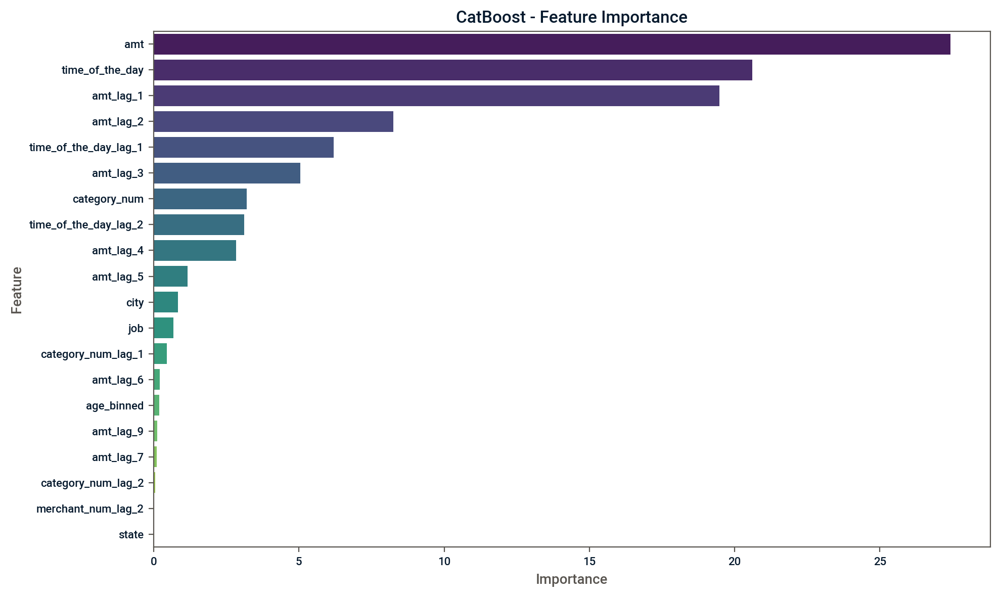

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

importances = model.get_feature_importance()
feature_names = x_train.columns if hasattr(x_train, "columns") else [f'feature_{i}' for i in range(x_train.shape[1])]

# Empacotando em um DataFrame para melhor visualização
import pandas as pd
feat_imp_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feat_imp_df = feat_imp_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=feat_imp_df.head(20), x='Importance', y='Feature', palette='viridis')
plt.title('CatBoost - Feature Importance')
plt.tight_layout()
plt.show()

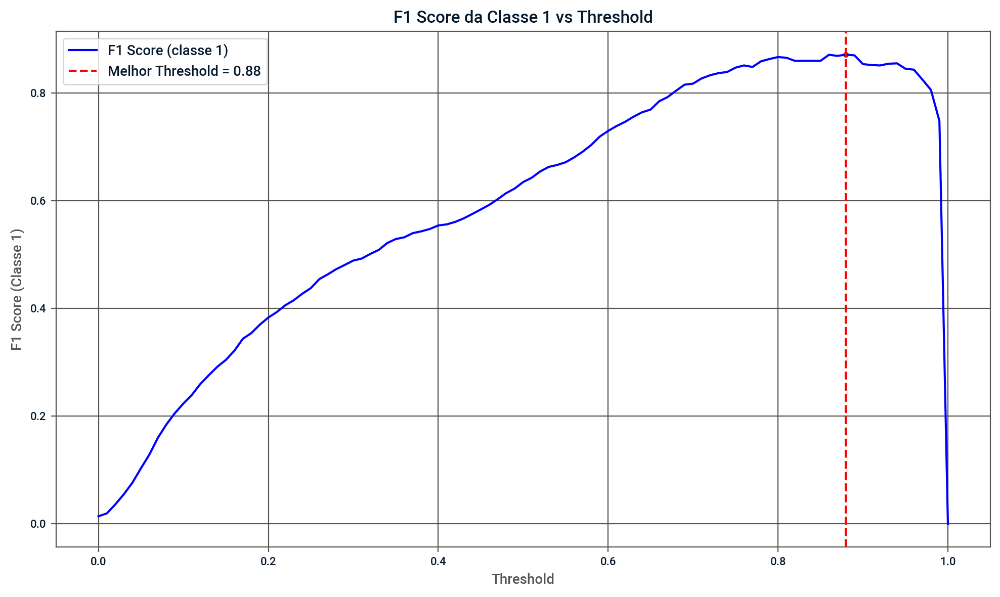

Melhor F1: 0.8717 no threshold: 0.88


In [82]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score

def plot_f1_vs_threshold(y_true, y_probs, step=0.01):
    thresholds = np.arange(0.0, 1.01, step)
    f1_scores = []

    for t in thresholds:
        y_pred = (y_probs >= t).astype(int)
        f1 = f1_score(y_true, y_pred, pos_label=1)
        f1_scores.append(f1)

    best_index = np.argmax(f1_scores)
    best_threshold = thresholds[best_index]
    best_f1 = f1_scores[best_index]

    plt.figure(figsize=(10, 6))
    plt.plot(thresholds, f1_scores, label='F1 Score (classe 1)', color='blue')
    plt.axvline(best_threshold, color='red', linestyle='--', label=f'Melhor Threshold = {best_threshold:.2f}')
    plt.scatter(best_threshold, best_f1, color='red')
    plt.title('F1 Score da Classe 1 vs Threshold')
    plt.xlabel('Threshold')
    plt.ylabel('F1 Score (Classe 1)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

    print(f"Melhor F1: {best_f1:.4f} no threshold: {best_threshold:.2f}")

y_true = y_test['is_fraud'].values.flatten()
y_probs = model.predict_proba(test_pool)[:, 1]
plot_f1_vs_threshold(y_true, y_probs)



Melhor threshold: 0.88
F1 Score (classe 1): 0.8717


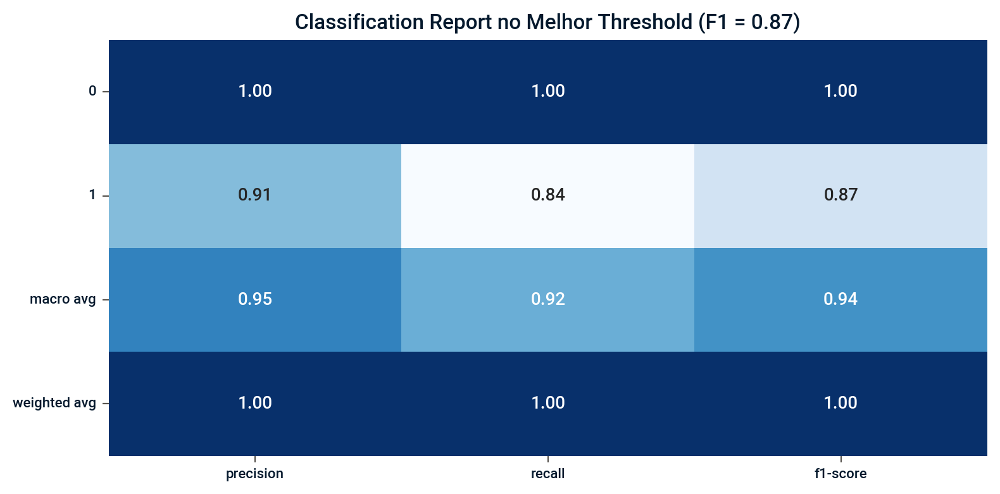

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27670
           1       0.91      0.84      0.87       194

    accuracy                           1.00     27864
   macro avg       0.95      0.92      0.94     27864
weighted avg       1.00      1.00      1.00     27864



In [83]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score, classification_report
import pandas as pd

def plot_classification_report_best_f1(y_true, y_probs, step=0.01):
    thresholds = np.arange(0.0, 1.01, step)
    best_f1 = 0
    best_threshold = 0
    best_pred = None

    for t in thresholds:
        y_pred = (y_probs >= t).astype(int)
        f1 = f1_score(y_true, y_pred, pos_label=1)
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = t
            best_pred = y_pred

    print(f"\nMelhor threshold: {best_threshold:.2f}")
    print(f"F1 Score (classe 1): {best_f1:.4f}")

    report_dict = classification_report(y_true, best_pred, output_dict=True)
    df = pd.DataFrame(report_dict).transpose().round(2)

    df = df[['precision', 'recall', 'f1-score']].drop(index=['accuracy'])

    plt.figure(figsize=(8, 4))
    sns.heatmap(df, annot=True, cmap="Blues", fmt=".2f", cbar=False)
    plt.title(f"Classification Report no Melhor Threshold (F1 = {best_f1:.2f})")
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    print(classification_report(y_true, best_pred))

plot_classification_report_best_f1(y_true, y_probs)


### Benchmark model for reference

In [99]:
features = num_features + cat_features # + lag_features

In [100]:
features

['amt',
 'lat',
 'long',
 'city_pop',
 'merch_lat',
 'merch_long',
 'age_binned',
 'time_of_the_day',
 'day_of_the_month',
 'month',
 'merchant_num',
 'category_num',
 'city',
 'state',
 'job']

In [101]:
x_train, y_train = df_train.loc[df_train[split_type_col] == 'TRAIN'][features], df_train.loc[df_train[split_type_col] == 'TRAIN'][[target_col]]
train_pool = Pool(
    x_train,
    y_train,
    cat_features=cat_features
)
x_val, y_val = df_train.loc[df_train[split_type_col] == 'VALID'][features], df_train.loc[df_train[split_type_col] == 'VALID'][[target_col]]
val_pool = Pool(
    x_val,
    y_val,
    cat_features=cat_features
)
x_test, y_test = df_train.loc[df_train[split_type_col] == 'TEST'][features], df_train.loc[df_train[split_type_col] == 'TEST'][[target_col]]
test_pool = Pool(
    x_test,
    y_test,
    cat_features=cat_features
)

In [107]:
model = CatBoostClassifier(
    n_estimators=10000,
    max_depth=3,
    loss_function='Logloss',
    eval_metric='F1',
    class_weights=[1, 10], # pior caso sem class_weights
    verbose=1
)

In [108]:
model.fit(
    train_pool,
    eval_set=val_pool,
    early_stopping_rounds=200
)

Learning rate set to 0.046793
0:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 176ms	remaining: 29m 15s
1:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 347ms	remaining: 28m 53s
2:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 511ms	remaining: 28m 23s
3:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 676ms	remaining: 28m 8s
4:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 838ms	remaining: 27m 55s
5:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 997ms	remaining: 27m 41s
6:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 1.15s	remaining: 27m 25s
7:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 1.3s	remaining: 27m 9s
8:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 1.47s	remaining: 27m 7s
9:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 1.62s	remaining: 27m 2s
10:	learn: 0.0000000	test: 0.0000000	best: 0.0000000 (0)	total: 1.78s	remaining: 27m 1s
11:	lea

In [110]:
predictions = model.predict_proba(test_pool)
y_probs = predictions[:, 1]


Melhor threshold: 0.55
F1 Score (classe 1): 0.5714


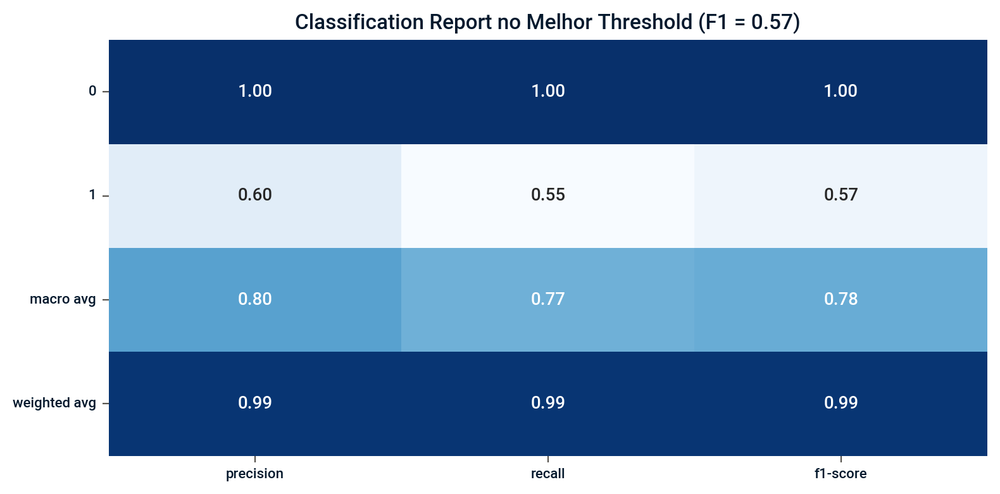

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27670
           1       0.60      0.55      0.57       194

    accuracy                           0.99     27864
   macro avg       0.80      0.77      0.78     27864
weighted avg       0.99      0.99      0.99     27864



In [111]:
plot_classification_report_best_f1(y_true, y_probs)


Melhor threshold: 0.91
F1 Score (classe 1): 0.7572


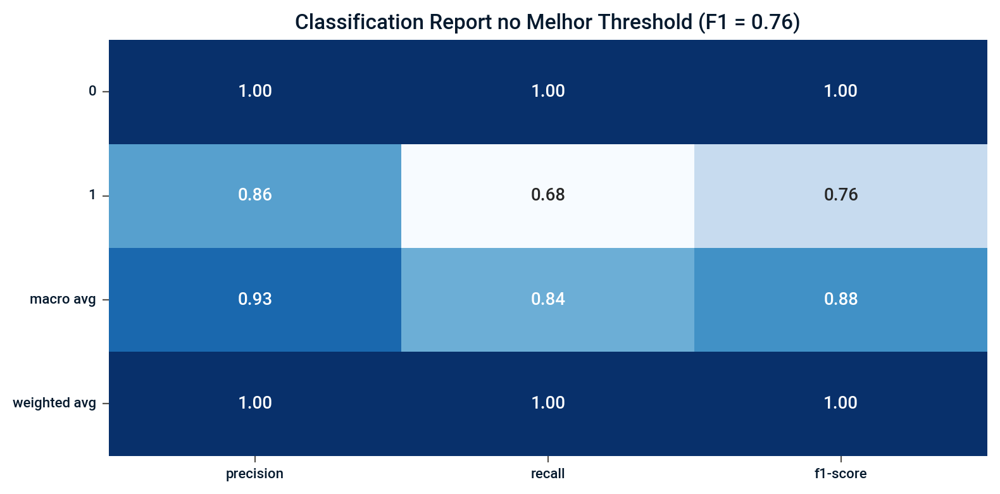

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27670
           1       0.86      0.68      0.76       194

    accuracy                           1.00     27864
   macro avg       0.93      0.84      0.88     27864
weighted avg       1.00      1.00      1.00     27864



In [106]:
plot_classification_report_best_f1(y_true, y_probs)